## Data Exploration

This notebook will help us understand the raw data set by generating statistics and visualizations on the class distribution, sequence length, etc.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
import re

# Load data
df = pd.read_csv('../data/raw/uniprot_raw.csv')

In [2]:
def clean_missing_values(df):
    # Check for different types of missing values
    missing_indicators = ['', 'NaN', 'nan', 'None', 'NULL', np.nan]

    # Replace various missing indicators with NaN
    for indicator in missing_indicators:
        df.replace(indicator, np.nan, inplace=True)
    
    # Remove rows with missing EC Numbers (target variable)
    df_clean = df.dropna(subset=['EC number']).copy()
    
    # For sequences, either remove or impute (rare case)
    df_clean = df_clean.dropna(subset=['Sequence'])
    
    print(f"Original shape: {df.shape}")
    print(f"After cleaning: {df_clean.shape}")
    print(f"Rows removed: {len(df) - len(df_clean)}")
    
    return df_clean

In [3]:
def validate_ec_number(ec, entry_id):
    """Validate EC number format and print removed entries"""
    if pd.isna(ec):
        print(f"REMOVED - Entry {entry_id}: Missing EC number")
        return None
    
    # Handle multiple EC numbers
    ec_numbers = str(ec).split(';')
    valid_ecs = []
    
    for ec_num in ec_numbers:
        ec_num = ec_num.strip()
        # Basic EC number pattern
        if re.match(r'^\d+\.(\d+|-)\.(\d+|-)\.(\d+|-)$', ec_num):
            valid_ecs.append(ec_num)
        else:
            print(f"REMOVED - Entry {entry_id}: Invalid EC number format '{ec_num}'")
    
    if not valid_ecs:
        print(f"REMOVED - Entry {entry_id}: No valid EC numbers found in '{ec}'")
        return None
    
    return ';'.join(valid_ecs)

In [4]:
def validate_sequence(seq, entry_id):
    """Validate protein sequence and print removed entries"""
    if pd.isna(seq):
        print(f"REMOVED - Entry {entry_id}: Missing sequence")
        return None
    
    seq = str(seq).upper().strip()
    
    # Remove non-amino acid characters and track what was removed
        # The protein alphabet contains twenty characters for amino acids 'A', 'C', 'D', 'E', 'F', 'G', 
        # 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'Y' and is augmented by four 
        # ambiguous characters 'X', 'B', 'Z' and 'J'. There are two aliases for the wildcard 'X'; '*' 
        # which would normally represent a stop codon and '.' which would normally represent a gap.

        # Non-standard codes: Two non-standard amino acids have been added to the alphabet:
        # U: Selenocystein
        # O: Pyrrolysine
    
    valid_aa = set('ABCDEFGHIJKLMNOPQRSTUVWXYZ')
    invalid_chars = set()
    seq_clean_chars = []
    
    for aa in seq:
        if aa in valid_aa:
            seq_clean_chars.append(aa)
        else:
            invalid_chars.add(aa)
    
    seq_clean = ''.join(seq_clean_chars)
    
    # Report invalid characters if any
    if invalid_chars:
        print(f"WARNING - Entry {entry_id}: Removed invalid characters {invalid_chars}")
    
    # Check sequence length constraints
    if len(seq_clean) < 10:
        print(f"REMOVED - Entry {entry_id}: Sequence too short ({len(seq_clean)} amino acids)")
        return None
    
    if len(seq_clean) > 20000:
        print(f"REMOVED - Entry {entry_id}: Sequence too long ({len(seq_clean)} amino acids)")
        return None
    
    if not seq_clean:
        print(f"REMOVED - Entry {entry_id}: Empty sequence after cleaning")
        return None
    
    return seq_clean

In [ ]:
def clean_validate (df):
    print("Data Cleaning")
    print("=" * 60)
    
    df_clean = df.copy()
    
    # Track initial stats
    initial_count = len(df_clean)
    print(f"Initial dataset size: {initial_count} entries")
    
    # Step 1: Handle missing values
    print("\n1. Checking for missing values...")
    df_clean = clean_missing_values(df_clean)
    
    # Step 2: Validate EC numbers
    # print("\n2. Validating EC numbers...")
    # df_clean['EC_Number_Clean'] = df_clean.apply(
    #     lambda row: validate_ec_number(row['EC number'], row['Entry']), 
    #     axis=1
    # )
    
    # Remove rows with invalid EC numbers
    # invalid_ec_mask = df_clean['EC_Number_Clean'].isna()
    # if invalid_ec_mask.any():
    #     invalid_ec_entries = df_clean[invalid_ec_mask]['Entry'].tolist()
    #     df_clean = df_clean[~invalid_ec_mask]

    #     print("\nTotal # of Invalid EC Numbers:")
    #     print(len(invalid_ec_entries))
    
    # Step 3: Validate sequences
    print("\n2. Validating sequences...")
    df_clean['Sequence_Clean'] = df_clean.apply(
        lambda row: validate_sequence(row['Sequence'], row['Entry']), 
        axis=1
    )
    
    # Remove rows with invalid sequences
    invalid_seq_mask = df_clean['Sequence_Clean'].isna()
    invalid_seq_entries = []
    if invalid_seq_mask.any():
        invalid_seq_entries = df_clean[invalid_seq_mask]['Entry'].tolist()
        df_clean = df_clean[~invalid_seq_mask]

    print("Total # of Invalid Sequences:")
    print(len(invalid_seq_entries))
    
    # Final statistics
    final_count = len(df_clean)
    removed_count = initial_count - final_count
    removal_rate = (removed_count / initial_count) * 100
    
    print("\n" + "=" * 60)
    print("CLEANING SUMMARY:")
    print(f"Initial entries: {initial_count}")
    print(f"Final entries: {final_count}")
    print(f"Entries removed: {removed_count} ({removal_rate:.2f}%)")
    print("=" * 60)
    
    return df_clean

# Run the cleaning pipeline
df = clean_validate(df)

# df.drop(['Sequence', 'EC number'], axis=1, inplace=True)
# df.rename(columns={'EC_Number_Clean': 'EC number', 'Sequence_Clean': 'Sequence'}, inplace=True)

df.drop(['Sequence'], axis=1, inplace=True)
df.rename(columns={'Sequence_Clean': 'Sequence'}, inplace=True)

Data Cleaning
Initial dataset size: 268376 entries

1. Checking for missing values...
Original shape: (268376, 3)
After cleaning: (268376, 3)
Rows removed: 0

3. Validating sequences...

Total # of Invalid Sequences:
0

CLEANING SUMMARY:
Initial entries: 268376
Final entries: 268376
Entries removed: 0 (0.00%)


In [6]:
def extract_ec_main_class(ec_number):
    """
    Extract the main class (first digit) from EC number
    EC format: a.b.c.d where:
    - a: main class (1-7)
    - b: subclass
    - c: sub-subclass
    - d: serial number
    """
    if pd.isna(ec_number):
        return None
    
    # Handle multiple EC numbers - take the first one
    ec_primary = str(ec_number).split(';')[0].strip()
    
    # Extract first digit (Main Class)
    if '.' in ec_primary:
        main_class = ec_primary.split('.')[0]
        # Validate it's a digit between 1-7
        if main_class.isdigit() and 1 <= int(main_class) <= 7:
            return int(main_class)
    
    return None

def get_ec_main_class_name(main_class):
    """Get the descriptive name for EC main classes"""
    ec_class_names = {
        1: 'Oxidoreductases',
        2: 'Transferases', 
        3: 'Hydrolases',
        4: 'Lyases',
        5: 'Isomerases',
        6: 'Ligases',
        7: 'Translocases'
    }
    return ec_class_names.get(main_class, 'Unknown')

df['EC_Main_Class'] = df['EC number'].apply(extract_ec_main_class)
df['EC_Main_Class_Name'] = df['EC_Main_Class'].apply(get_ec_main_class_name)

In [7]:
# Basic info
print(f"Dataset shape: {df.shape}")
print(f"Columns: {df.columns.tolist()}")

print("\nBasic info:")
df.info()

print("\nFirst few rows:")
df.head()

Dataset shape: (268376, 5)
Columns: ['Entry', 'EC number', 'Sequence', 'EC_Main_Class', 'EC_Main_Class_Name']

Basic info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 268376 entries, 0 to 268375
Data columns (total 5 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   Entry               268376 non-null  object
 1   EC number           268376 non-null  object
 2   Sequence            268376 non-null  object
 3   EC_Main_Class       268376 non-null  int64 
 4   EC_Main_Class_Name  268376 non-null  object
dtypes: int64(1), object(4)
memory usage: 10.2+ MB

First few rows:


,Entry,EC number,Sequence,EC_Main_Class,EC_Main_Class_Name
0,A0A009IHW8,3.2.2.-; 3.2.2.6,MSLEQKKGADIISKILQIQNSIGKTTSPSTLKTKLSEISRKEQENA...,3,Hydrolases
1,A0A023I7E1,3.2.1.39,MRFQVIVAAATITMITSYIPGVASQSTSDGDDLFVPVSNFDPKSIF...,3,Hydrolases
2,A0A024RXP8,3.2.1.91,MYRKLAVISAFLATARAQSACTLQSETHPPLTWQKCSSGGTCTQQT...,3,Hydrolases
3,A0A024SC78,3.1.1.74,MRSLAILTTLLAGHAFAYPKPAPQSVNRRDWPSINEFLSELAKVMP...,3,Hydrolases
4,A0A024SH76,3.2.1.91,MIVGILTTLATLATLAASVPLEERQACSSVWGQCGGQNWSGPTCCA...,3,Hydrolases



Sequence length statistics:
count    268376.000000
mean        375.572790
std         176.704606
min          50.000000
25%         248.000000
50%         345.000000
75%         466.000000
max        1000.000000
Name: Sequence_Length, dtype: float64


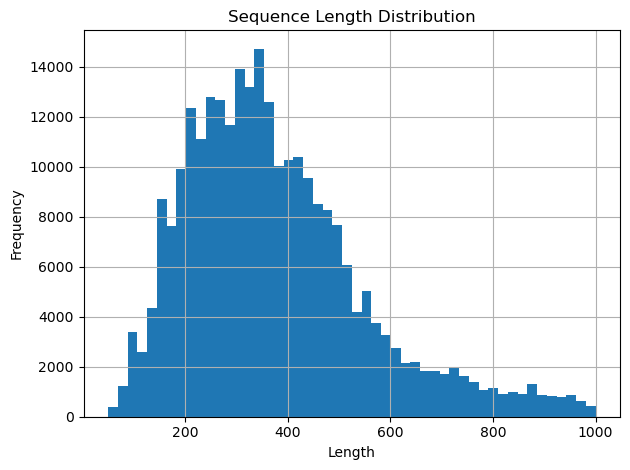

In [8]:
# Sequence length distribution
print("\nSequence length statistics:")
df['Sequence_Length'] = df['Sequence'].str.len()
print(df['Sequence_Length'].describe())

df['Sequence_Length'].hist(bins=50)
plt.title('Sequence Length Distribution')
plt.xlabel('Length')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [9]:
def ec_number_distribution(df):
    """
    Analyze and visualize the distribution of proteins by EC number categories
    """    
    # Initialize counters
    single_ec = 0
    multi_ec_same_class = 0
    multi_ec_different_classes = 0
    
    # Store examples for each category
    examples = {
        'single_ec': [],
        'multi_ec_same_class': [],
        'multi_ec_different_classes': []
    }
    
    for idx, row in df.iterrows():
        ec_numbers = str(row['EC number']).split(';')
        
        if len(ec_numbers) == 1:
            # Single EC number
            single_ec += 1
            if len(examples['single_ec']) < 3:  # Store up to 3 examples
                examples['single_ec'].append((row['Entry'], ec_numbers[0]))
                
        else:
            # Multiple EC numbers - check if same main class
            main_classes = set()
            for ec in ec_numbers:
                ec = ec.strip()
                if '.' in ec:
                    main_class = ec.split('.')[0]
                    main_classes.add(main_class)
            
            if len(main_classes) == 1:
                # All EC numbers have same main class
                multi_ec_same_class += 1
                if len(examples['multi_ec_same_class']) < 3:
                    examples['multi_ec_same_class'].append((row['Entry'], ec_numbers, list(main_classes)))
            else:
                # Different main classes
                multi_ec_different_classes += 1
                if len(examples['multi_ec_different_classes']) < 3:
                    examples['multi_ec_different_classes'].append((row['Entry'], ec_numbers, list(main_classes)))
    
    # Calculate totals and percentages
    total_entries = len(df)
    categories = {
        'Single EC number': single_ec,
        'Multi-EC, same main class': multi_ec_same_class,
        'Multi-EC, different main classes': multi_ec_different_classes
    }
    
    percentages = {k: (v / total_entries) * 100 for k, v in categories.items()}
    
    return categories, percentages, examples, total_entries

def create_interactive_ec_distribution(categories, percentages):
    """
    Create an interactive pie chart using Plotly
    """
    labels = list(categories.keys())
    sizes = list(categories.values())
    
    # Create hover text with detailed information
    hover_text = [f'{label}<br>{count:,} entries<br>{percentages[label]:.2f}%' 
                 for label, count in categories.items()]
    
    fig = px.pie(values=sizes, names=labels, 
                 title='Distribution of Proteins by EC Number Categories',
                 hover_data=[hover_text],
                 color=labels,
                 color_discrete_map={
                     'Single EC number': '#66c2a5',
                     'Multi-EC, same main class': '#fc8d62', 
                     'Multi-EC, different main classes': '#8da0cb'
                 })
    
    fig.update_traces(textposition='inside', textinfo='percent',
                      hovertemplate='<b>%{label}</b><br>%{customdata[0]}<extra></extra>',
                      customdata=[[text] for text in hover_text])
    
    fig.update_layout(
        title_x=0.5,
        title_font_size=16,
        showlegend=True,
        legend=dict(orientation="v", yanchor="middle", y=0.5, xanchor="left", x=1.1)
    )

    fig.update_layout(
        width=900,   
        height=600  
    )
    
    fig.show()

def print_detailed_statistics(categories, percentages, examples, total_entries):
    """
    Print detailed statistics about the EC number distribution
    """
    print("\n" + "="*70)
    print("DETAILED EC NUMBER DISTRIBUTION STATISTICS")
    print("="*70)
    
    for category, count in categories.items():
        print(f"{category:<35}: {count:>7,} entries ({percentages[category]:>6.2f}%)")
    
    print(f"\n{'Total entries':<35}: {total_entries:>7,} entries (100.00%)")
    
    # Print examples
    print("\n" + "="*70)
    print("EXAMPLES FOR EACH CATEGORY")
    print("="*70)
    
    print(f"\nSingle EC number examples:")
    for entry, ec in examples['single_ec']:
        print(f"  - {entry}: {ec}")
    
    print(f"\nMulti-EC, same main class examples:")
    for entry, ec_list, main_classes in examples['multi_ec_same_class']:
        print(f"  - {entry}: {ec_list} → Main class: {main_classes[0]}")
    
    print(f"\nMulti-EC, different main classes examples:")
    for entry, ec_list, main_classes in examples['multi_ec_different_classes']:
        print(f"  - {entry}: {ec_list} → Main classes: {main_classes}")

# Main function to run the complete analysis
def run_complete_ec_distribution_analysis(df):
    """
    Run complete analysis of EC number distribution across categories
    """
    # Analyze the distribution
    categories, percentages, examples, total_entries = ec_number_distribution(df)
    
    # Create interactive pie chart
    create_interactive_ec_distribution(categories, percentages)
    
    # Print detailed statistics
    print_detailed_statistics(categories, percentages, examples, total_entries)
    
    return categories, percentages, examples

# Run the analysis
categories, percentages, examples = run_complete_ec_distribution_analysis(df)


DETAILED EC NUMBER DISTRIBUTION STATISTICS
Single EC number                   : 251,372 entries ( 93.66%)
Multi-EC, same main class          :  10,871 entries (  4.05%)
Multi-EC, different main classes   :   6,133 entries (  2.29%)

Total entries                      : 268,376 entries (100.00%)

EXAMPLES FOR EACH CATEGORY

Single EC number examples:
  - A0A023I7E1: 3.2.1.39
  - A0A024RXP8: 3.2.1.91
  - A0A024SC78: 3.1.1.74

Multi-EC, same main class examples:
  - A0A009IHW8: ['3.2.2.-', ' 3.2.2.6'] → Main class: 3
  - A0A072VDF2: ['1.2.1.-', ' 1.2.1.44'] → Main class: 1
  - A0A075FBG7: ['4.2.3.131', ' 4.2.3.189', ' 4.2.3.190'] → Main class: 4

Multi-EC, different main classes examples:
  - A0A061I403: ['2.7.7.108', ' 3.1.4.-'] → Main classes: ['3', '2']
  - A0A0A7HFE1: ['2.7.7.-', ' 3.1.-.-'] → Main classes: ['3', '2']
  - A0A0H2WZ38: ['3.5.1.2', ' 6.3.5.13'] → Main classes: ['3', '6']


In [10]:
def multi_ec_different_classes(df):
    """
    Analyze entries with multiple EC numbers that have different main classes
    """    
    multi_ec_entries = []
    
    for idx, row in df.iterrows():
        ec_numbers = str(row['EC number']).split(';')
        
        if len(ec_numbers) > 1:  # Multiple EC numbers
            # Extract main classes (first digit before first dot)
            main_classes = set()
            for ec in ec_numbers:
                ec = ec.strip()
                if '.' in ec:
                    main_class = ec.split('.')[0]
                    main_classes.add(main_class)
            
            # Check if multiple different main classes exist
            if len(main_classes) > 1:
                multi_ec_entries.append({
                    'Entry': row['Entry'],
                    'EC_numbers': ec_numbers,
                    'main_classes': list(main_classes),
                    'num_main_classes': len(main_classes),
                    'sequence_length': len(str(row['Sequence']))
                })
        
    return multi_ec_entries

# Interactive visualization using Plotly
def create_interactive_multi_ec_plot(multi_ec_df):
    """
    Create interactive visualization using Plotly
    """
    if multi_ec_df.empty:
        return
    
    # Interactive pie chart for main class combinations
    main_class_combinations = []
    for _, row in multi_ec_df.iterrows():
        combo = '-'.join(sorted(row['main_classes']))
        main_class_combinations.append(combo)
    
    combo_counts = pd.Series(main_class_combinations).value_counts().reset_index()
    combo_counts.columns = ['combination', 'count']
    
    if len(combo_counts) > 0:
        fig = px.pie(combo_counts.head(10), values='count', names='combination',
                     title='Top 10 Main Class Combinations in Multi-EC Entries')
        fig.update_layout(
            width=600,   
            height=600  
        )
        fig.show()

# Main analysis function
def run_multi_ec_analysis(df):
    """
    Run complete analysis for entries with multiple EC numbers from different main classes
    """
    multi_ec_entries = multi_ec_different_classes(df)

    if multi_ec_entries:
        multi_ec_df = pd.DataFrame(multi_ec_entries)
        
        # Create interactive plots
        create_interactive_multi_ec_plot(multi_ec_df)
        
        return multi_ec_df
    else:
        print("No entries found with multiple EC numbers from different main classes.")
        return None

# Run the analysis
multi_ec_results = run_multi_ec_analysis(df)

In [11]:
def get_ec_main_class_display(main_class):
    """Get display format with number and name"""
    if pd.isna(main_class):
        return "Unknown"
    class_name = get_ec_main_class_name(main_class)
    return f"{main_class}. {class_name}"

df['EC_Main_Class_Display'] = df['EC_Main_Class'].apply(get_ec_main_class_display)

In [ ]:
# Summary Table
print("=== MAIN CLASS DETAILED STATISTICS ===")
summary_data = []
for main_class in sorted(df['EC_Main_Class'].dropna().unique()):
    class_data = df[df['EC_Main_Class'] == main_class]
    class_display = get_ec_main_class_display(main_class)
    
    summary_data.append({
        'EC_Main_Class': main_class,
        'EC_Main_Class_Display': class_display,
        'Count': len(class_data),
        'Percentage': f"{len(class_data)/len(df)*100:.2f}%",
        'Avg_Sequence_Length': f"{class_data['Sequence_Length'].mean():.1f}",
        'Min_Sequence_Length': class_data['Sequence_Length'].min(),
        'Max_Sequence_Length': class_data['Sequence_Length'].max(),
        'Median_Sequence_Length': class_data['Sequence_Length'].median()
    })

# Create summary dataframe
summary_df = pd.DataFrame(summary_data)
print("\n=== COMPREHENSIVE SUMMARY TABLE ===")
print(summary_df.to_string(index=False))

# Data quality summary with class numbers
print("\n=== DATA QUALITY SUMMARY ===")
print(f"Total entries: {len(df):,}")

=== MAIN CLASS DETAILED STATISTICS ===

=== COMPREHENSIVE SUMMARY TABLE ===
 EC_Main_Class EC_Main_Class_Display  Count Percentage Avg_Sequence_Length  Min_Sequence_Length  Max_Sequence_Length  Median_Sequence_Length
             1    1. Oxidoreductases  35217     13.12%               385.9                   50                 1000                   350.0
             2       2. Transferases  92342     34.41%               360.7                   50                 1000                   331.0
             3         3. Hydrolases  58413     21.77%               350.4                   50                 1000                   305.0
             4             4. Lyases  24297      9.05%               341.8                   53                  999                   320.0
             5         5. Isomerases  15511      5.78%               369.1                   52                  998                   349.0
             6            6. Ligases  28081     10.46%               496.1    

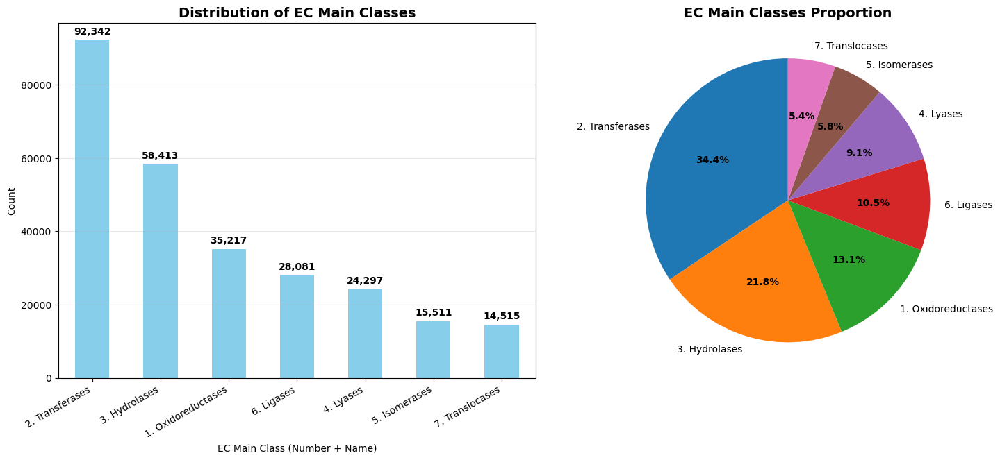

In [13]:
main_class_dist = df['EC_Main_Class_Display'].value_counts()

plt.figure(figsize=(15, 12))

# Plot 1: Main class distribution 
plt.subplot(2, 2, 1)
main_class_dist.plot(kind='bar', color='skyblue')
plt.title('Distribution of EC Main Classes', fontsize=14, fontweight='bold')
plt.xlabel('EC Main Class (Number + Name)')
plt.ylabel('Count')
plt.xticks(rotation=30, ha='right')
plt.grid(axis='y', alpha=0.3)

for i, v in enumerate(main_class_dist.values):
    plt.text(i, v + max(main_class_dist.values)*0.01, f'{v:,}', 
             ha='center', va='bottom', fontweight='bold')

# Plot 2: Pie chart 
plt.subplot(2, 2, 2)
wedges, texts, autotexts = plt.pie(main_class_dist.values, 
                                   labels=main_class_dist.index, 
                                   autopct='%1.1f%%',
                                   startangle=90)
plt.title('EC Main Classes Proportion', fontsize=14, fontweight='bold')
for autotext in autotexts:
    autotext.set_fontweight('bold')

plt.tight_layout()
plt.show()

# Plot 3: [Interactive] Sequence length by main class with numbers
if 'Sequence_Length' not in df.columns:
    df['Sequence_Length'] = df['Sequence'].str.len()

valid_classes = df.dropna(subset=['EC_Main_Class_Display'])

try:
    fig = px.box(valid_classes, 
                 x='EC_Main_Class_Name', 
                 y='Sequence_Length',
                 color='EC_Main_Class_Name',
                 color_discrete_sequence=px.colors.qualitative.Set2,
                 title='Sequence Length Distribution by EC Main Class',
                 hover_data=['EC_Main_Class_Name'])
    
    for i, class_name in enumerate(valid_classes['EC_Main_Class_Name'].unique()):
        count = len(valid_classes[valid_classes['EC_Main_Class_Name'] == class_name])
        mean_val = valid_classes[valid_classes['EC_Main_Class_Name'] == class_name]['Sequence_Length'].mean()
        
        fig.add_annotation(
            x=class_name,
            y=valid_classes[valid_classes['EC_Main_Class_Name'] == class_name]['Sequence_Length'].max() * 1.1,
            text=f"n={count}<br>mean={mean_val:.0f}",
            showarrow=False,
            font=dict(size=10, color="red")
        )
        fig.update_layout(
            width=1000,   
            height=600  
        )
    fig.show()
    
except ImportError:
    print("Plotly not installed. Using matplotlib only.")

In [14]:
df.to_csv('../data/raw/uniprot_cleaned.csv', index=False)
print("\nData saved to 'uniprot_cleaned.csv'")


Data saved to 'uniprot_cleaned.csv'
